In [1]:
# Load packages
suppressPackageStartupMessages({
    library(ggplot2)
    library(biomaRt)
    library(BiocParallel)
    library(Matrix)
    library(matrixStats)
    library(scater)
    library(reshape2)
    library(knitr)
    library(scran)
    library(SingleCellExperiment)
    library(Seurat)
    library(data.table)
    library(dplyr)
    library(gridExtra)
    library(viridis)
    
    library(edgeR)
    library(ggrastr)
    library(ggrepel)
})
    ncores = 4
    mcparam = MulticoreParam(workers = ncores)
    register(mcparam)
    BPPARAM = SerialParam()

options(repr.plot.width=15, repr.plot.height=8)

In [2]:
main = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/'

In [3]:
source("/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/mapping_functions.R")

In [4]:
load_atlas_data(remove_doublets=TRUE, remove_stripped=TRUE)

In [5]:
genenames = fread("/rds/project/rds-SDzz0CATGms/users/bt392/gene_names.csv") %>% 
            setnames(c('ensembl_gene_id','external_gene_name'), c('gene', 'gene_name'))
genenames = genenames[genenames$gene %in% rownames(sce)]
genenames = merge(genenames, as.data.frame(rownames(sce)), by.x='gene', by.y='rownames(sce)', all.y=TRUE)
genenames$gene_name[genenames$gene_name==''] = NA
genenames[is.na(genenames$gene_name),] = genenames$gene[is.na(genenames$gene_name)]
genenames = genenames[order(match(genenames$gene, rownames(sce)))]
rownames(sce) = genenames$gene_name

In [18]:
gene1 = 'Eomes'
gene2 = 'Pdgfra'

meta_small = meta[as.vector(logcounts(sce[gene1,])>0) & as.vector(logcounts(sce[gene2,])>0),]
sce_small = sce[, meta_small$cell]

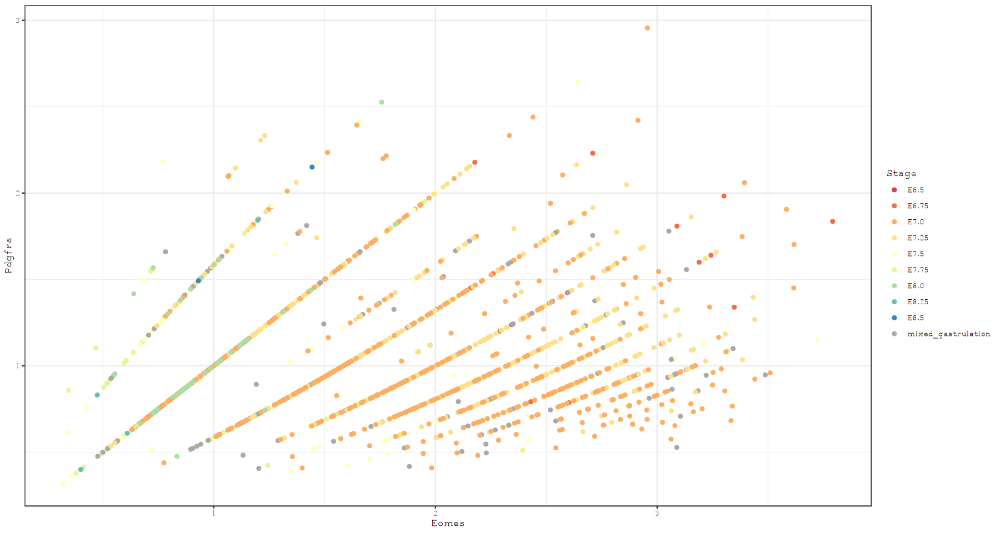

In [19]:

# Compare expression
ggplot(meta_small, aes(as.vector(logcounts(sce_small[gene1,])),as.vector(logcounts(sce_small[gene2,])), col=stage)) + 
        geom_point() + 
        xlab(gene1) +
        ylab(gene2) + 
        scale_colour_manual(values = stage_colours, name = "Stage") +
        theme_bw()

In [20]:
nrow(meta_small)

[1] 2021

In [21]:
#Downsample to 10k cells per sample (or maximum number of cells in sample)
set.seed(42)
keep = lapply(unique(meta$stage), function(x){
  if(x == "mixed_gastrulation"){
    return(c())
  } else if(sum(meta$stage == x) < 10000) {
    return(which(meta$stage == x))
  } else {
    hits = which(meta$stage == x)
    return(sample(hits, 10000))
  }
})
keep = do.call(c, keep)
cells_keep = unique(c(meta[keep,]$cell, meta_small$cell))

meta = meta[meta$cell %in% cells_keep,]
sce = sce[, meta$cell]

In [22]:
meta$dp = ifelse(meta$cell %in% meta_small$cell, TRUE, FALSE)

In [24]:
doDiffExpr <- function(sce, groups, min_detection_rate_per_group = 0.50) {
    
  # Sanity checks
  if (!is(sce, "SingleCellExperiment")) stop("'sce' has to be an instance of SingleCellExperiment")
  stopifnot(length(groups)==2)

  # Filter genes by detection rate per group
  cdr_A <- rowMeans(logcounts(sce[,sce$group==groups[1]])>0) >= min_detection_rate_per_group
  cdr_B <- rowMeans(logcounts(sce[,sce$group==groups[2]])>0) >= min_detection_rate_per_group
  out <- .edgeR(sce[cdr_B | cdr_A,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  
  return(out)
}

.edgeR <- function(sce) {
  
  # Convert SCE to DGEList
  
  sce_edger <- scran::convertTo(sce, type="edgeR")
 # sce_edger$samples$norm.factors = sce_edger$samples$sizeFactor
    
  # Define design matrix (with intercept)
  cdr <- colMeans(logcounts(sce)>0)
  design <- model.matrix(~cdr+sce$group)
  
  # Estimate dispersions
  sce_edger  <- estimateDisp(sce_edger,design)
  
  # Fit GLM
  fit <- glmQLFit(sce_edger,design)
  
  # Likelihood ratio test
  lrt <- glmQLFTest(fit)
  
  # Construct output data.frame
  out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
    setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
    .[,c("logCPM","LR"):=NULL]
  
  return(out)
}

In [25]:
opts = list()
opts$min.logFC <- 1
opts$threshold_fdr = 0.01

In [26]:
sce$group = meta$dp
opts$groups = c(FALSE,TRUE)
sce$group = factor(sce$group, levels = opts$groups)

cdr.dt <- data.table(
  rownames(sce),
  rowMeans(logcounts(sce[,sce$group==opts$groups[1]])>0) %>% round(2),
  rowMeans(logcounts(sce[,sce$group==opts$groups[2]])>0) %>% round(2)
) %>% setnames(c("gene",sprintf("detection_rate_%s",opts$groups[1]),sprintf("detection_rate_%s",opts$groups[2])))

out <- doDiffExpr(sce, opts$groups) %>%
  # Add sample statistics
  .[,c("groupA_N","groupB_N"):=list(table(sce$group)[1],table(sce$group)[2])]%>% 
  .[,c("groupA","groupB"):=list(opts$groups[1],opts$groups[2])]%>%  
  # Add gene statistics
#  merge(cdr.dt, all.y=T, by="gene") %>%
  # Calculate statistical significance
  .[, sig := (padj_fdr<=opts$threshold_fdr & abs(logFC)>=opts$min.logFC)] %>%
  .[is.na(sig),sig:=FALSE] %>% 
  setorder(-sig, padj_fdr, na.last=T)

# Parse columns
out[,c("p.value","padj_fdr","logFC","log_padj_fdr"):=list(signif(p.value,digits=3), signif(padj_fdr,digits=3), round(logFC,3),round(log_padj_fdr,3))]


gene,logFC,p.value,padj_fdr,log_padj_fdr,groupA_N,groupB_N,groupA,groupB,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<lgl>,<lgl>,<lgl>
Lefty2,3.513,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Mesp1,3.386,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Tdgf1,2.536,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Mixl1,2.453,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Lhx1,2.435,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Pdgfra,2.354,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Dll3,2.038,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Snai1,1.852,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
Frzb,1.699,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE


In [27]:
write.csv(out, paste0(main, 'markers.csv'), row.names=FALSE)

In [52]:
out = read.csv(paste0(main, 'markers.csv'))

In [55]:
out[out$sig==TRUE,]

,gene,logFC,p.value,padj_fdr,log_padj_fdr,groupA_N,groupB_N,groupA,groupB,sig
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<lgl>,<lgl>,<lgl>
1,Lefty2,3.513,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
2,Mesp1,3.386,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
3,Tdgf1,2.536,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
4,Mixl1,2.453,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
5,Lhx1,2.435,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
6,Pdgfra,2.354,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
7,Dll3,2.038,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
8,Snai1,1.852,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE
9,Frzb,1.699,0.00e+00,0.00e+00,Inf,74279,2021,FALSE,TRUE,TRUE


In [6]:
markers = c('Tdgf1', 'Dll3', 'Agtrap', 'Gas1', 'Efna3')
#neg_marker = c('Slc2a1','','',)

In [7]:
plot_gene = function(x){
    ggplot(meta, aes(umapX, umapY, col=as.vector(logcounts(sce[x,])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = paste0('log ', x), 
             subtitle = 'WT') +
        umap_theme
    }

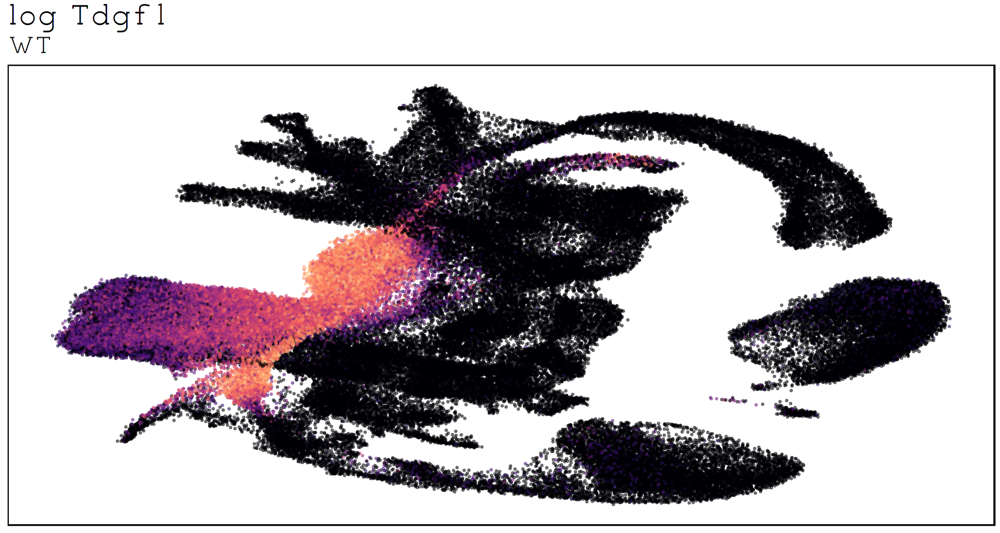

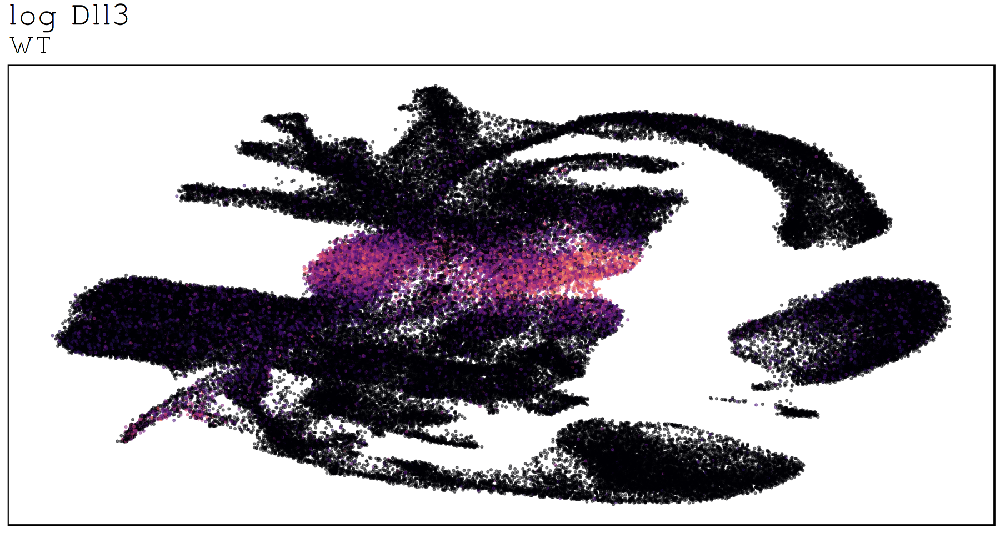

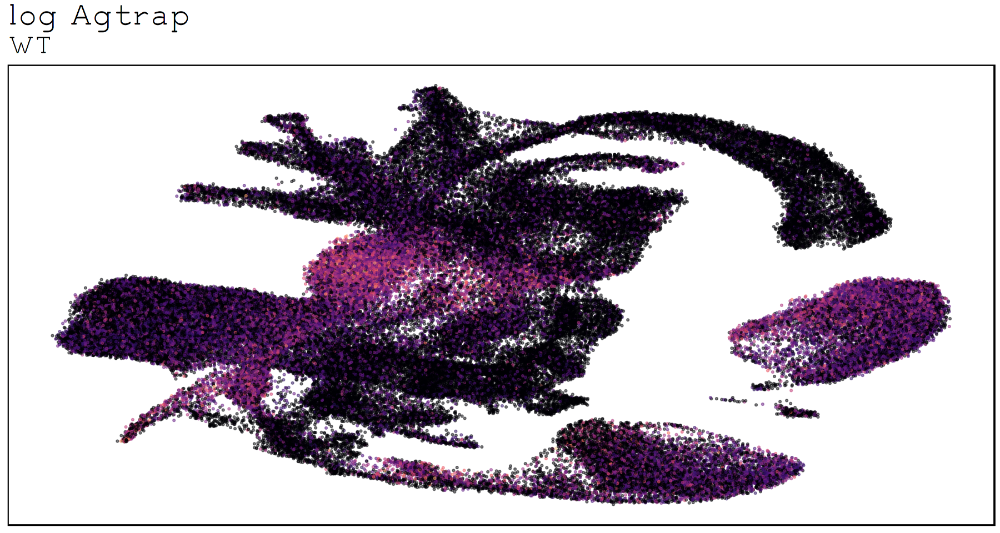

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


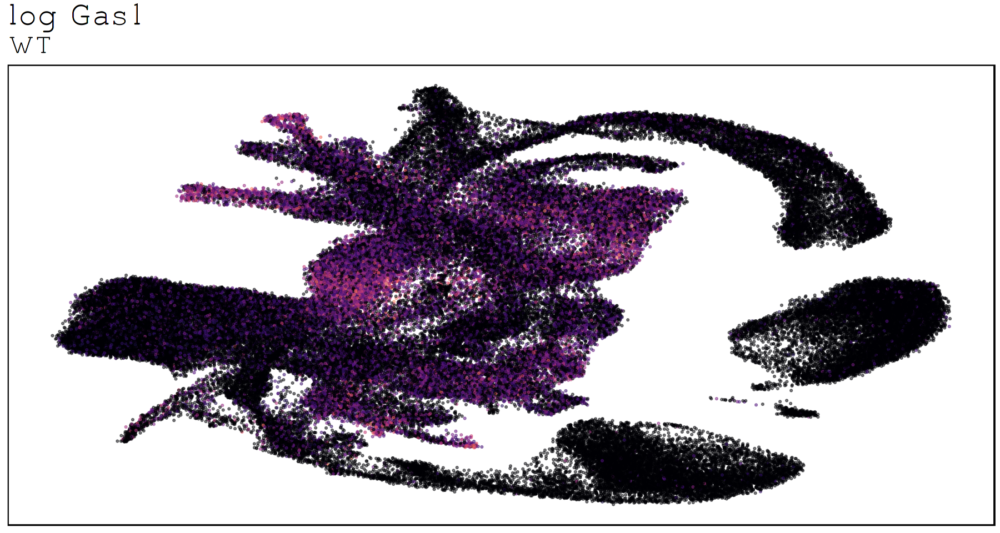

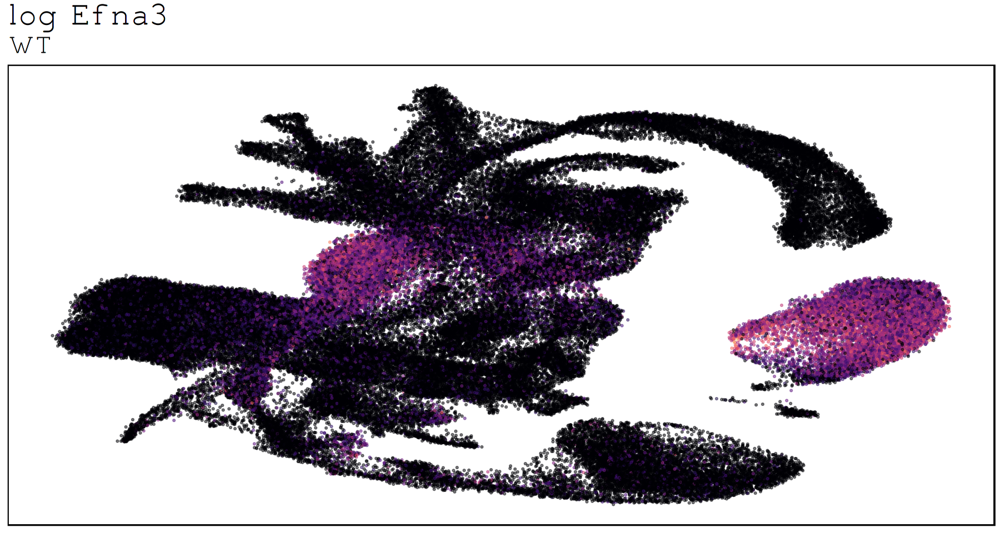

In [9]:
lapply(markers, plot_gene)

Warning message:
“Removed 23019 rows containing missing values (geom_point).”


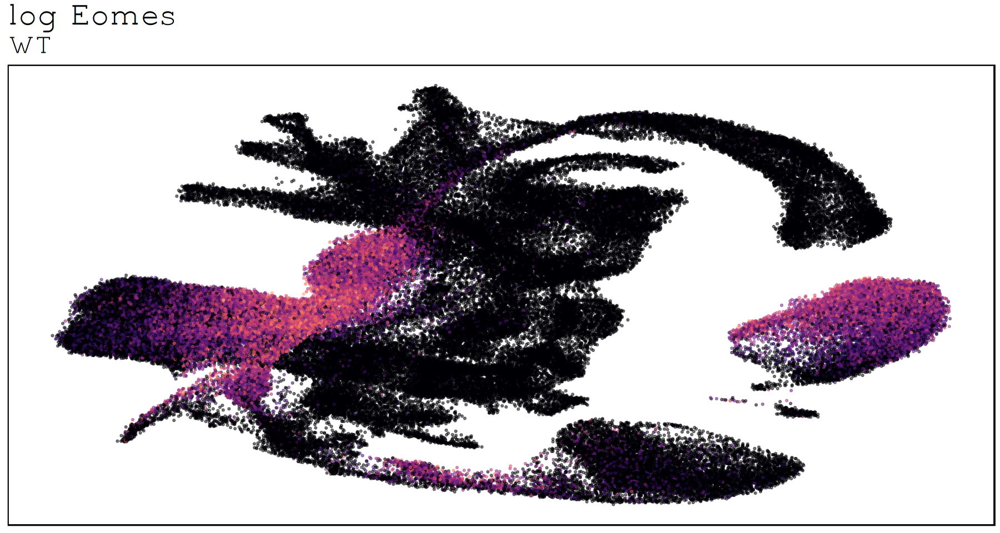

In [8]:
x = 'Eomes'
ggplot(meta, aes(umapX, umapY, col=as.vector(logcounts(sce[x,])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = paste0('log ', x), 
             subtitle = 'WT') +
        umap_theme

Warning message:
“Removed 23019 rows containing missing values (geom_point).”


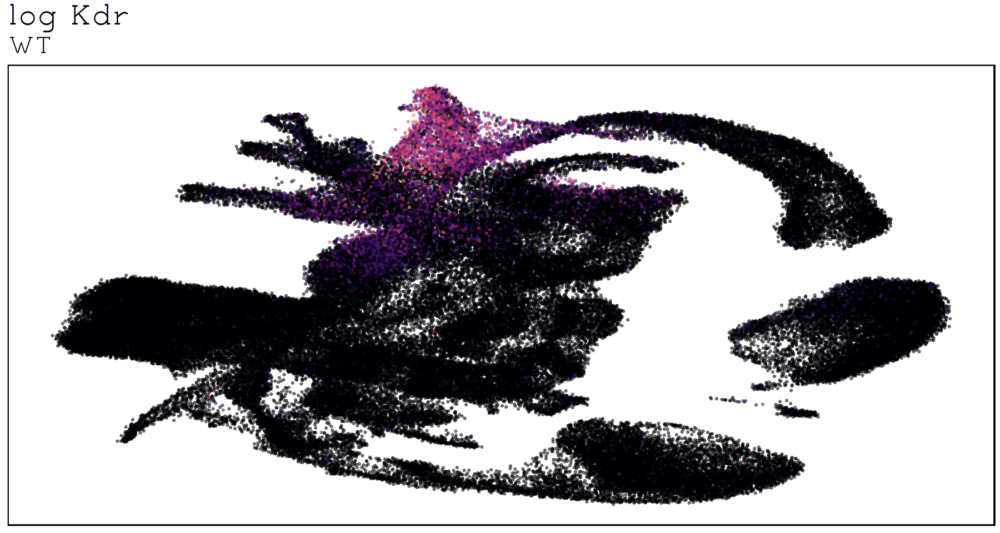

In [9]:
x = 'Kdr'
ggplot(meta, aes(umapX, umapY, col=as.vector(logcounts(sce[x,])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = paste0('log ', x), 
             subtitle = 'WT') +
        umap_theme

Warning message:
“Removed 23019 rows containing missing values (geom_point).”


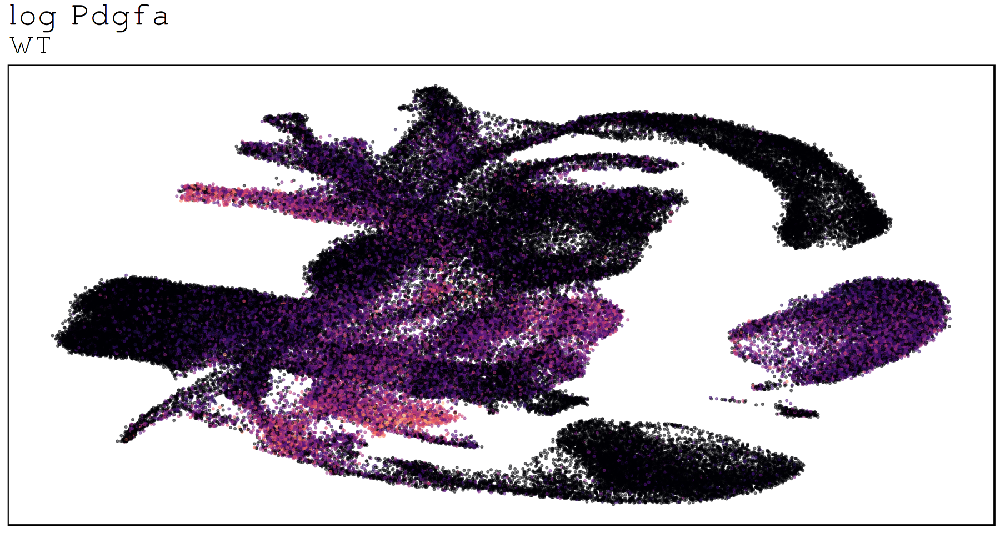

In [10]:
x = 'Pdgfa'
ggplot(meta, aes(umapX, umapY, col=as.vector(logcounts(sce[x,])))) + 
        geom_point(size = 0.7, alpha = 0.5) + 
        scale_color_viridis(option='magma') + 
        labs(title = paste0('log ', x), 
             subtitle = 'WT') +
        umap_theme

ERROR while rich displaying an object: Error in h(simpleError(msg, call)): error in evaluating the argument 'object' in selecting a method for function 'logcounts': index out of bounds: Pdgfara

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), 

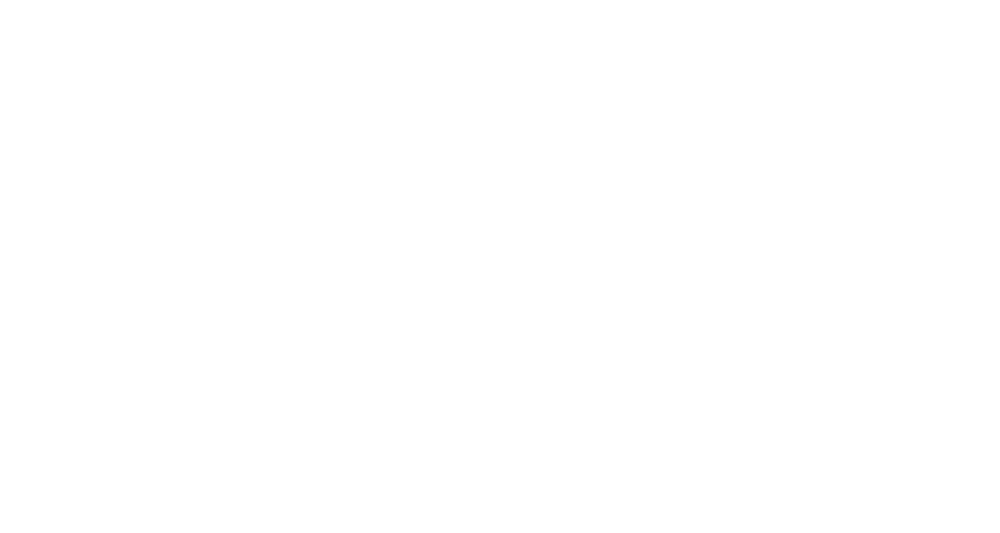

In [15]:
ggplot(meta, aes(as.vector(logcounts(sce['Eomes',])),as.vector(logcounts(sce['Pdgfa',])), col=stage)) + 
        geom_point() + 
        scale_colour_manual(values = stage_colours, name = "Stage") +
        theme_bw()

In [ ]:
mouse_ensembl = useMart("ensembl")
mouse_ensembl = useDataset("mmusculus_gene_ensembl", mart = mouse_ensembl)

#gene_map = getBM(attributes=c("ensembl_gene_id", "entrezgene_id"), values = entrezgene, mart = mouse_ensembl)

In [ ]:
filters = listFilters(mouse_ensembl)
write.csv(filters, paste0(main, 'ensembl.csv'), row.names=FALSE)

In [ ]:
filters = listFilters(mouse_ensembl)    
entrezgene = c("3098","728642|982")   
gene_map = getBM(attributes=c("ensembl_gene_id", "entrezgene_id", 'external_gene_name'), values = entrezgene, mart = mouse_ensembl)

In [27]:
gene_map$entrezgene_id[is.na(gene_map$entrezgene_id)] = gene_map$ensembl_gene_id[is.na(gene_map$entrezgene_id)]

In [35]:
gene_map[gene_map$entrezgene_id == 29873,]

,ensembl_gene_id,entrezgene_id,external_gene_name
,<chr>,<chr>,<chr>
42731,ENSMUSG00000032482,29873,Cspg5
